In [ ]:
import pandas as pd


df = pd.read_csv('grade.csv')
df

,Accuracy-note,Completeness-note,Relevance-note,Understandability-note,Formatting-note,Accuracy,Completeness,Relevance,Understandability,Formatting,General-note,Model,Answer,Prompt,Doctest,Place
0,"initializes paths""?",stdout/stdin? cli?,NaN,NaN,NaN,2.0,1.0,3.0,3.0,3.0,NaN,out_anthropic-claude-3-7-sonnet-or,<explanation>\nThis code implements a program ...,just_task,1.0,0
1,creating and managing paths?,stdin/stdout?,NaN,NaN,NaN,2.0,2.0,3.0,3.0,3.0,NaN,out_anthropic-claude-3-7-sonnet-or,<explanation>\nThe `program-data-storage` clas...,just_task,1.0,1
2,NaN,NaN,NaN,NaN,NaN,3.0,3.0,3.0,3.0,3.0,NaN,out_anthropic-claude-3-7-sonnet-or,<explanation>\nThe `program-data` class repres...,just_task,1.0,2
3,duplicates = consecutive duplicates,NaN,NaN,redundnant note about empty list check. Too de...,NaN,2.0,3.0,3.0,2.0,3.0,NaN,out_anthropic-claude-3-7-sonnet-or,<explanation>\nThe `actualized` method is part...,just_task,1.0,3
4,NaN,NaN,NaN,NaN,NaN,3.0,3.0,3.0,3.0,3.0,NaN,out_anthropic-claude-3-7-sonnet-or,<explanation>\nThe `program-version` class rep...,just_task,1.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,NaN,stdin/out?,NaN,NaN,NaN,3.0,2.0,3.0,3.0,3.0,NaN,out_deepseek-deepseek-r1-or,```\n<explanation>\nThe `program-data-storage`...,no_examples,2.0,1
476,duplicates = consecutive duplicates,out outs?,NaN,NaN,NaN,2.0,2.0,3.0,3.0,3.0,NaN,out_deepseek-deepseek-r1-or,```\n<explanation>\nThe `program-data` structu...,no_examples,2.0,2
477,NaN,NaN,NaN,"and version list length comparison""???",NaN,3.0,3.0,3.0,2.0,3.0,NaN,out_deepseek-deepseek-r1-or,<explanation>\nThe `actualized` function withi...,no_examples,1.0,3
478,NaN,NaN,NaN,NaN,NaN,3.0,3.0,3.0,3.0,3.0,NaN,out_deepseek-deepseek-r1-or,```\n<explanation>\nThe `program-version` obje...,no_examples,4.0,4


In [ ]:
# Ensure absence of invalid numeric values (NaN or negative)

numeric_cols = df.select_dtypes(include=['number']).columns
numeric_cols = numeric_cols.drop('Doctest', errors='ignore')
numeric_cols = numeric_cols.drop('Output Quality', errors='ignore')
numeric_cols = numeric_cols.drop('Place', errors='ignore')

negative_or_nan_condition = df[numeric_cols].lt(0) | df[numeric_cols].isna() | df[numeric_cols].gt(3)

df[negative_or_nan_condition.any(axis=1)]


,Accuracy-note,Completeness-note,Relevance-note,Understandability-note,Formatting-note,Accuracy,Completeness,Relevance,Understandability,Formatting,General-note,Model,Answer,Prompt,Doctest,Place,Doctest Success,Is Reasoning Model


In [ ]:
# Predefined set of models
reasoning_models = {'out_deepseek-deepseek-r1-or',
 'out_openai-o3-mini-or',
 'out_qwen-qwq-32b-or'}
df['Is Reasoning Model'] = df['Model'].isin(reasoning_models)

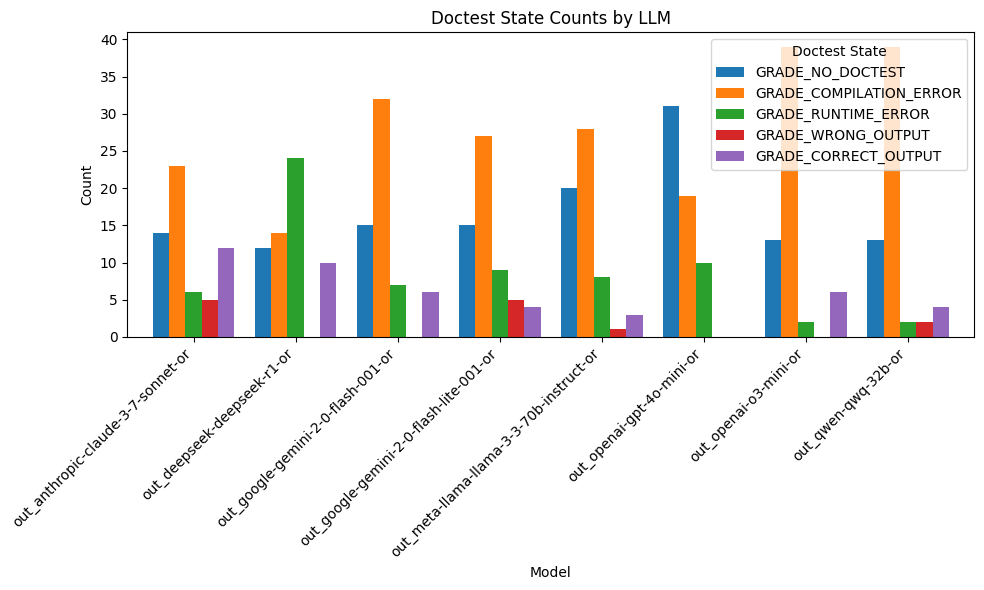

In [ ]:
# Plot Doctest state('Doctest') by LLM('Model')
# Label mapping:
# ```
# GRADE_NO_DOCTEST = 0
# GRADE_COMPILATION_ERROR = 1
# GRADE_RUNTIME_ERROR = 2
# GRADE_WRONG_OUTPUT = 3
# GRADE_CORRECT_OUTPUT = 4
# ```

import matplotlib.pyplot as plt

# Count occurrences of each Doctest state for each LLM
doctest_counts = df.groupby(['Model', 'Doctest']).size().unstack(fill_value=0)

# Define the order of states and corresponding labels
state_order = [0, 1, 2, 3, 4]
state_labels = ['GRADE_NO_DOCTEST', 'GRADE_COMPILATION_ERROR', 'GRADE_RUNTIME_ERROR', 'GRADE_WRONG_OUTPUT', 'GRADE_CORRECT_OUTPUT']

# Create the bar plot
ax = doctest_counts.loc[:, state_order].plot(kind='bar', figsize=(10, 6), width=0.8)

# Customize the plot
plt.xlabel('Model')
plt.ylabel('Count')
plt.title('Doctest State Counts by LLM')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.legend(title='Doctest State', labels=state_labels)


plt.tight_layout()  # Adjust layout to prevent labels from overlapping
plt.show()


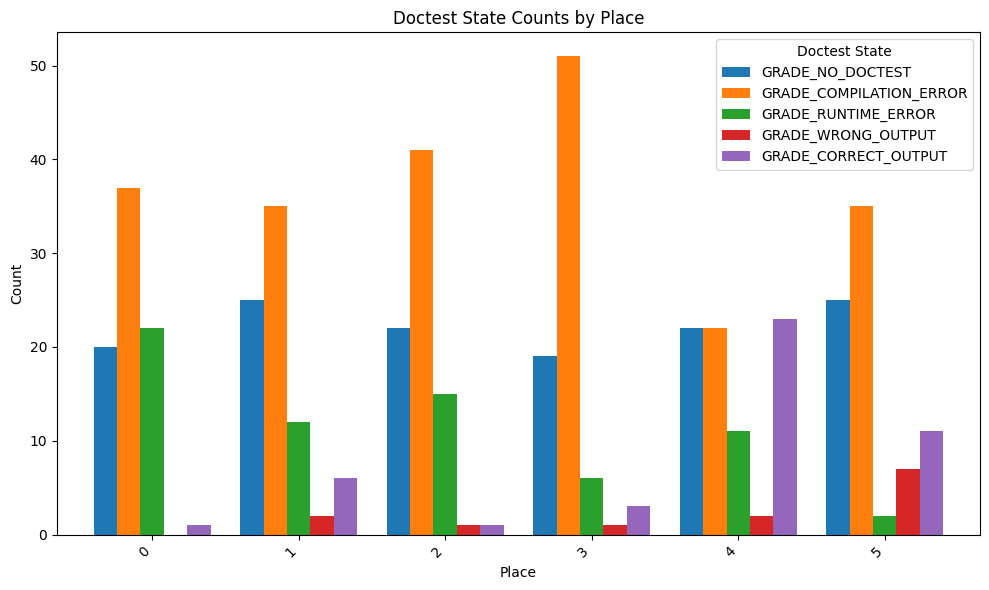

In [ ]:
# Plot Doctest state('Doctest') by place in code that is being documented('Place')
# Label mapping:
# ```
# GRADE_NO_DOCTEST = 0
# GRADE_COMPILATION_ERROR = 1
# GRADE_RUNTIME_ERROR = 2
# GRADE_WRONG_OUTPUT = 3
# GRADE_CORRECT_OUTPUT = 4
# ```

import matplotlib.pyplot as plt

# Count occurrences of each Doctest state for each LLM
doctest_counts = df.groupby(['Place', 'Doctest']).size().unstack(fill_value=0)

# Define the order of states and corresponding labels
state_order = [0, 1, 2, 3, 4]
state_labels = ['GRADE_NO_DOCTEST', 'GRADE_COMPILATION_ERROR', 'GRADE_RUNTIME_ERROR', 'GRADE_WRONG_OUTPUT', 'GRADE_CORRECT_OUTPUT']

# Create the bar plot
ax = doctest_counts.loc[:, state_order].plot(kind='bar', figsize=(10, 6), width=0.8)

# Customize the plot
plt.xlabel('Place')
plt.ylabel('Count')
plt.title('Doctest State Counts by Place')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.legend(title='Doctest State', labels=state_labels)


plt.tight_layout()  # Adjust layout to prevent labels from overlapping
plt.show()


In [ ]:
# Consider 'success' doctest when >= GRADE_RUNTIME_ERROR (meaning compilation was successfull)

import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd

# Calculate the output quality
df['Doctest Success'] = (df['Doctest'] >= 2)

# Display the DataFrame with the new column
df

,Accuracy-note,Completeness-note,Relevance-note,Understandability-note,Formatting-note,Accuracy,Completeness,Relevance,Understandability,Formatting,General-note,Model,Answer,Prompt,Doctest,Place,Doctest Success
0,"initializes paths""?",stdout/stdin? cli?,NaN,NaN,NaN,2.0,1.0,3.0,3.0,3.0,NaN,out_anthropic-claude-3-7-sonnet-or,<explanation>\nThis code implements a program ...,just_task,1.0,0,False
1,creating and managing paths?,stdin/stdout?,NaN,NaN,NaN,2.0,2.0,3.0,3.0,3.0,NaN,out_anthropic-claude-3-7-sonnet-or,<explanation>\nThe `program-data-storage` clas...,just_task,1.0,1,False
2,NaN,NaN,NaN,NaN,NaN,3.0,3.0,3.0,3.0,3.0,NaN,out_anthropic-claude-3-7-sonnet-or,<explanation>\nThe `program-data` class repres...,just_task,1.0,2,False
3,duplicates = consecutive duplicates,NaN,NaN,redundnant note about empty list check. Too de...,NaN,2.0,3.0,3.0,2.0,3.0,NaN,out_anthropic-claude-3-7-sonnet-or,<explanation>\nThe `actualized` method is part...,just_task,1.0,3,False
4,NaN,NaN,NaN,NaN,NaN,3.0,3.0,3.0,3.0,3.0,NaN,out_anthropic-claude-3-7-sonnet-or,<explanation>\nThe `program-version` class rep...,just_task,1.0,4,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,NaN,stdin/out?,NaN,NaN,NaN,3.0,2.0,3.0,3.0,3.0,NaN,out_deepseek-deepseek-r1-or,```\n<explanation>\nThe `program-data-storage`...,no_examples,2.0,1,True
476,duplicates = consecutive duplicates,out outs?,NaN,NaN,NaN,2.0,2.0,3.0,3.0,3.0,NaN,out_deepseek-deepseek-r1-or,```\n<explanation>\nThe `program-data` structu...,no_examples,2.0,2,True
477,NaN,NaN,NaN,"and version list length comparison""???",NaN,3.0,3.0,3.0,2.0,3.0,NaN,out_deepseek-deepseek-r1-or,<explanation>\nThe `actualized` function withi...,no_examples,1.0,3,False
478,NaN,NaN,NaN,NaN,NaN,3.0,3.0,3.0,3.0,3.0,NaN,out_deepseek-deepseek-r1-or,```\n<explanation>\nThe `program-version` obje...,no_examples,4.0,4,True


In [ ]:
# Compare qualities by LLMs grouped by doctest success

import altair as alt

# Create the bar chart
# Understandability +???
# Formatting +???
# Accuracy -
# Relevance -
# Completeness -
alt.Chart(df).mark_bar().encode(
    x='Model:N',
    y='mean(Understandability):Q',
    color='Doctest Success:N',
    column='Doctest Success:N'
).properties(width=200)


alt.Chart(...)

In [ ]:
# Calculate pearson correlation between Doctest Success and different qualities. Also calculate statitstical significance

from scipy.stats import linregress
import itertools

output
new = df.copy()
new["Doctest Success"] = new["Doctest Success"].astype(float)

only_reasoning = new[new['Is Reasoning Model'] == True]
only_non_reasoning = new[new['Is Reasoning Model'] == False]


for (stat, model_restriction) in itertools.product([
'Understandability',
'Accuracy',
'Formatting',
'Relevance',
'Completeness'
], [new, only_reasoning, only_non_reasoning]):
  print(stat, "ALL" if model_restriction is new else "REASONING" if model_restriction is only_reasoning else "NON-REASONING")
  print(linregress(x=model_restriction["Doctest Success"], y=model_restriction[stat]))

Understandability ALL
LinregressResult(slope=np.float64(0.20917406510626801), intercept=np.float64(2.6638418079096047), rvalue=np.float64(0.1848177268260442), pvalue=np.float64(4.6263594787315646e-05), stderr=np.float64(0.05087488015120472), intercept_stderr=np.float64(0.02606561960667449))
Understandability REASONING
LinregressResult(slope=np.float64(0.20461538461538503), intercept=np.float64(2.715384615384615), rvalue=np.float64(0.19524335942320817), pvalue=np.float64(0.008625727148513), stderr=np.float64(0.07703932443547333), intercept_stderr=np.float64(0.040603289102793545))
Understandability NON-REASONING
LinregressResult(slope=np.float64(0.20817669172932257), intercept=np.float64(2.6339285714285716), rvalue=np.float64(0.17694504308488046), pvalue=np.float64(0.0020959151319740786), stderr=np.float64(0.06707768707656074), intercept_stderr=np.float64(0.03376169544859561))
Accuracy ALL
LinregressResult(slope=np.float64(0.02004304546677451), intercept=np.float64(2.725988700564972), rv

In [ ]:
df[df['Formatting'] < 3]

,Accuracy-note,Completeness-note,Relevance-note,Understandability-note,Formatting-note,Accuracy,Completeness,Relevance,Understandability,Formatting,General-note,Model,Answer,Prompt,Doctest,Place,Doctest Success
6,NaN,stdin/stdout not mentioned.,"whole code, not class",NaN,NaN,3.0,2.0,1.0,3.0,1.5,NaN,out_google-gemini-2-0-flash-001-or,```\n<explanation>\nThe code defines a complex...,just_task,1.0,0,False
8,NaN,no mention of stdin/stdout.,program-version is also documented?,for some reason list object itself in the subl...,md. Weird double spaces are present.,3.0,2.0,2.0,2.0,1.5,NaN,out_google-gemini-2-0-flash-001-or,```\n<explanation>\nThe code defines an object...,just_task,1.0,2,False
18,"nested"" structures?",stdin/stdout,NaN,NaN,weird unicode.,2.0,2.0,3.0,3.0,1.5,NaN,out_openai-o3-mini-or,<explanation>\nThis EO-based code defines an a...,just_task,1.0,0,False
23,NaN,NaN,NaN,NaN,weird unicode,3.0,3.0,3.0,3.0,1.5,NaN,out_openai-o3-mini-or,<explanation>\nThis code defines an “external”...,just_task,1.0,5,False
41,NaN,NaN,NaN,Does not mention that all IO apperation are ac...,"Problems with response format, breaking system",3.0,3.0,3.0,2.0,0.0,response format broken(?),out_openai-gpt-4o-mini-or,```\nThe code defines a structure for handling...,just_task,0.0,5,False
66,not within app...,stdin/stdout,no need to mention logging...,NaN,classic weird unicode,2.0,2.0,2.0,3.0,1.5,NaN,out_openai-o3-mini-or,<explanation>\nThe “app” structure bootstraps ...,no_explanation,1.0,0,False
79,NaN,stdin/stdout?,NaN,NaN,double whitespace,3.0,2.0,3.0,3.0,1.5,NaN,out_google-gemini-2-0-flash-lite-001-or,```\n<explanation>\nRepresents storage for pro...,no_explanation,1.0,1,False
81,if it's not already present = false,NaN,NaN,NaN,double whitespace,2.0,3.0,3.0,3.0,1.5,NaN,out_google-gemini-2-0-flash-lite-001-or,```\n<explanation>\nUpdates program data by ad...,no_explanation,1.0,3,False
114,Writes the updated data back to file storage.,external call? maybe stdin/stdout?,why addditional substructures,NaN,weird unicode,2.0,2.0,2.0,3.0,1.5,NaN,out_openai-o3-mini-or,<explanation>\nThis EO application structure d...,just_task,1.0,0,False
116,NaN,NaN,NaN,too into impl,weird unicode,3.0,3.0,3.0,2.0,1.5,NaN,out_openai-o3-mini-or,<explanation>\nThis EO structure defines a “pr...,just_task,1.0,2,False



===== Accuracy =====
                                  Multiple Comparison of Means - Tukey HSD, FWER=0.05                                  
                 group1                                   group2                  meandiff p-adj   lower  upper  reject
-----------------------------------------------------------------------------------------------------------------------
      out_anthropic-claude-3-7-sonnet-or              out_deepseek-deepseek-r1-or   0.0167    1.0 -0.2553 0.2887  False
      out_anthropic-claude-3-7-sonnet-or       out_google-gemini-2-0-flash-001-or   0.0667 0.9955 -0.2053 0.3387  False
      out_anthropic-claude-3-7-sonnet-or  out_google-gemini-2-0-flash-lite-001-or  -0.0167    1.0 -0.2887 0.2553  False
      out_anthropic-claude-3-7-sonnet-or out_meta-llama-llama-3-3-70b-instruct-or     -0.2 0.3306  -0.472  0.072  False
      out_anthropic-claude-3-7-sonnet-or                out_openai-gpt-4o-mini-or      0.1 0.9525  -0.172  0.372  False
      out_anthropi

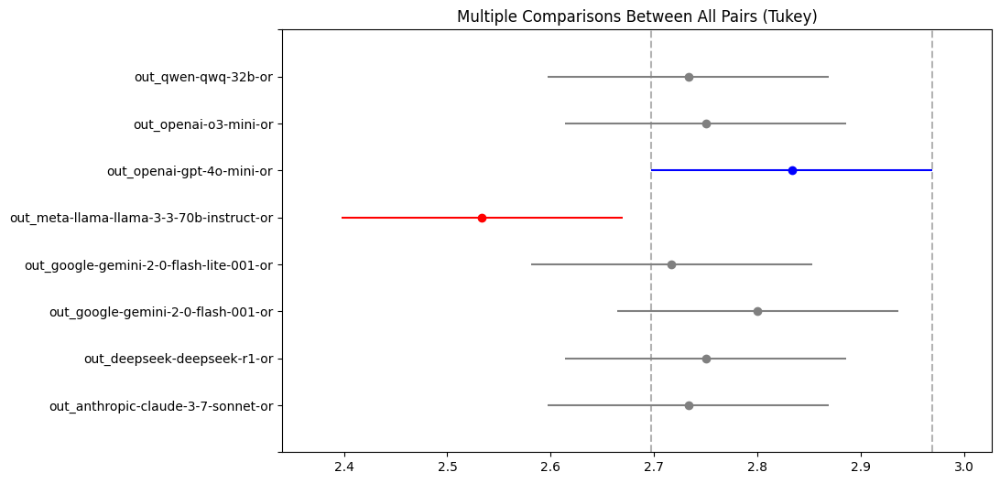

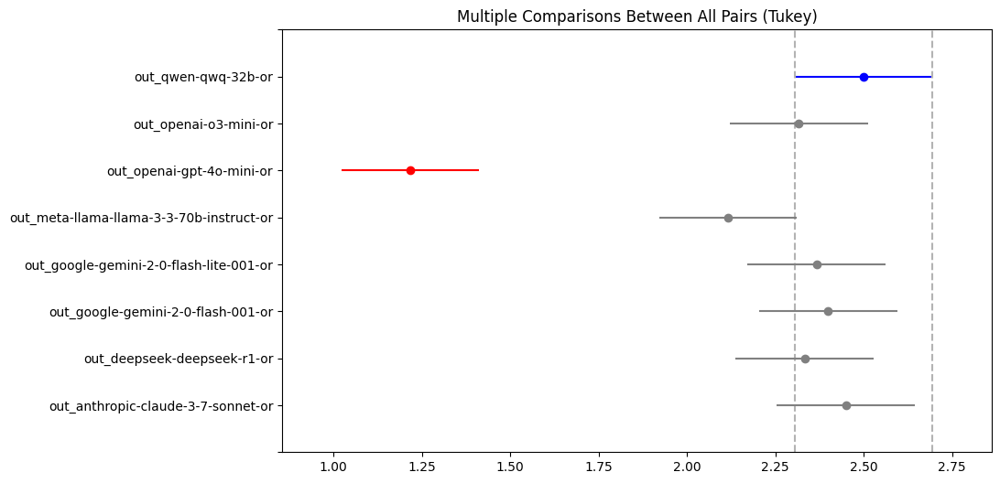

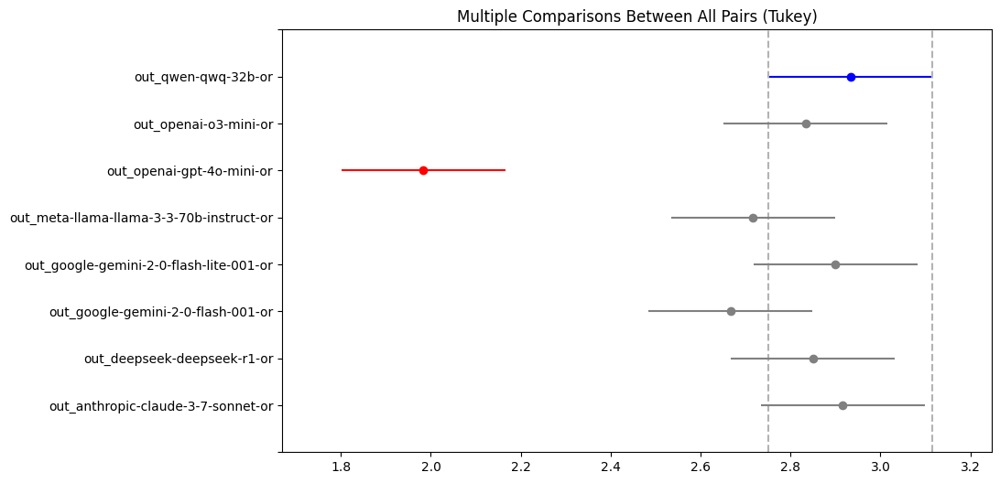

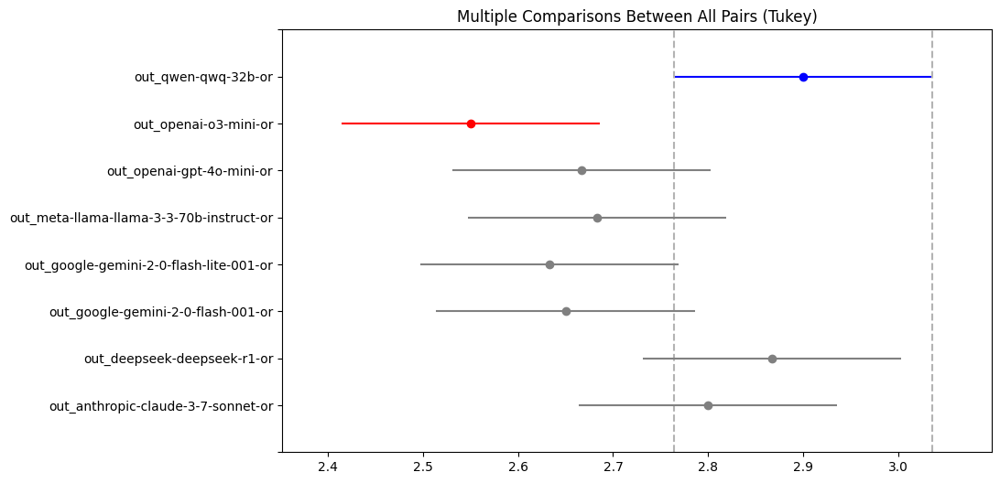

In [ ]:
# Statistical comparison (using statsmodels)
from statsmodels.stats.multicomp import pairwise_tukeyhsd

results = {}
for dimension in ['Accuracy', 'Completeness', 'Relevance', 'Understandability']:
    print(f"\n===== {dimension} =====")
    tukey = pairwise_tukeyhsd(
        endog=df[dimension],
        groups=df['Model'],
        alpha=0.05
    )
    print(tukey.summary())
    results[dimension] = tukey
    top_model = (df.groupby('Model')[dimension].mean()
                .sort_values(ascending=False)
                .index[0])
    tukey.plot_simultaneous(
        comparison_name = top_model
    )

#results['Completeness'].plot_simultaneous()
print()

In [ ]:
import numpy as np
import pandas as pd
from scipy import stats

# For each model and dimension
metrics = {
    'SD': df.groupby('Model')['Accuracy'].std(),
    'SE': df.groupby('Model')['Accuracy'].sem(),
    'Range': df.groupby('Model')['Accuracy'].apply(lambda x: x.max() - x.min()),
    'n': df.groupby('Model').size()
}

metrics

{'SD': Model
 out_anthropic-claude-3-7-sonnet-or          0.482461
 out_deepseek-deepseek-r1-or                 0.436667
 out_google-gemini-2-0-flash-001-or          0.403376
 out_google-gemini-2-0-flash-lite-001-or     0.490301
 out_meta-llama-llama-3-3-70b-instruct-or    0.700282
 out_openai-gpt-4o-mini-or                   0.375823
 out_openai-o3-mini-or                       0.508404
 out_qwen-qwq-32b-or                         0.445948
 Name: Accuracy, dtype: float64,
 'SE': Model
 out_anthropic-claude-3-7-sonnet-or          0.062285
 out_deepseek-deepseek-r1-or                 0.056373
 out_google-gemini-2-0-flash-001-or          0.052076
 out_google-gemini-2-0-flash-lite-001-or     0.063298
 out_meta-llama-llama-3-3-70b-instruct-or    0.090406
 out_openai-gpt-4o-mini-or                   0.048519
 out_openai-o3-mini-or                       0.065635
 out_qwen-qwq-32b-or                         0.057572
 Name: Accuracy, dtype: float64,
 'Range': Model
 out_anthropic-claude-3-7-so


===== Accuracy =====
        Multiple Comparison of Means - Tukey HSD, FWER=0.05        
    group1         group2     meandiff p-adj   lower  upper  reject
-------------------------------------------------------------------
     just_task    no_doctests   0.0625 0.9045 -0.1322 0.2572  False
     just_task    no_examples  -0.0104 0.9999 -0.2051 0.1842  False
     just_task no_explanation   0.1146 0.4905 -0.0801 0.3092  False
     just_task  normal_prompt      0.0    1.0 -0.1947 0.1947  False
   no_doctests    no_examples  -0.0729 0.8434 -0.2676 0.1217  False
   no_doctests no_explanation   0.0521 0.9488 -0.1426 0.2467  False
   no_doctests  normal_prompt  -0.0625 0.9045 -0.2572 0.1322  False
   no_examples no_explanation    0.125 0.3993 -0.0697 0.3197  False
   no_examples  normal_prompt   0.0104 0.9999 -0.1842 0.2051  False
no_explanation  normal_prompt  -0.1146 0.4905 -0.3092 0.0801  False
-------------------------------------------------------------------

===== Completeness =====


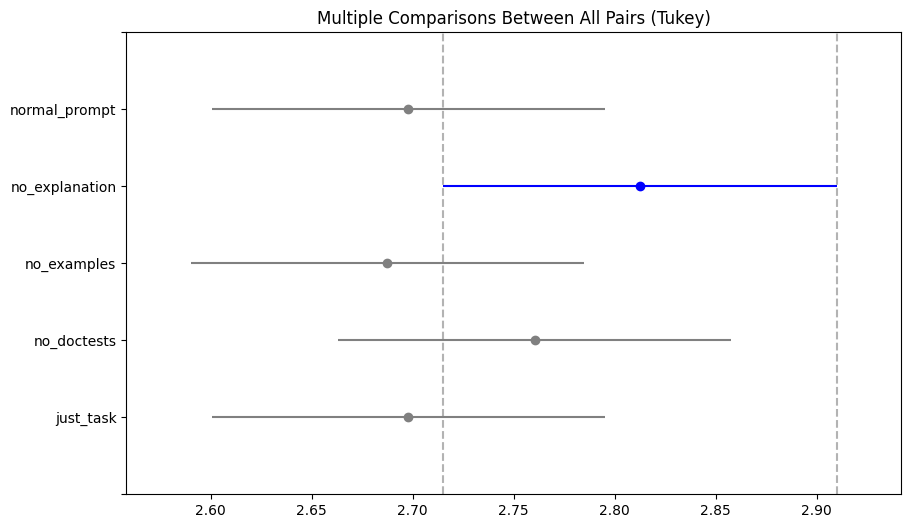

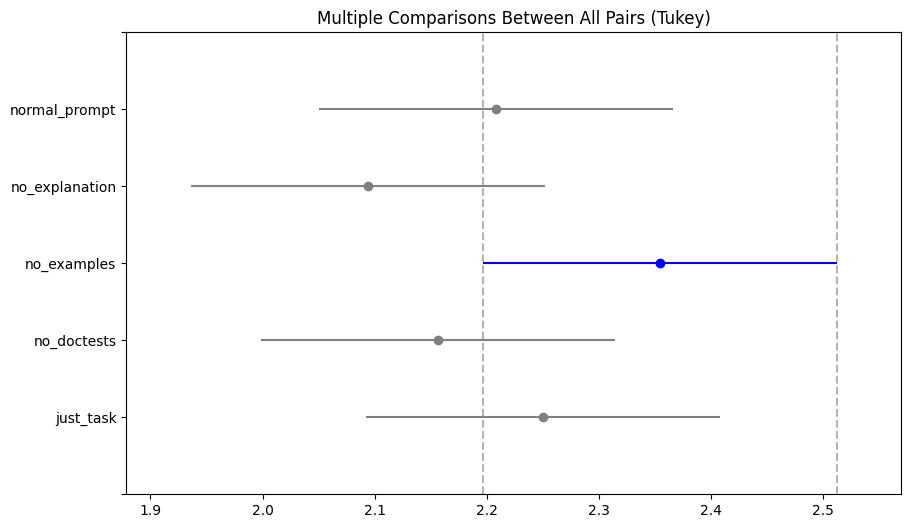

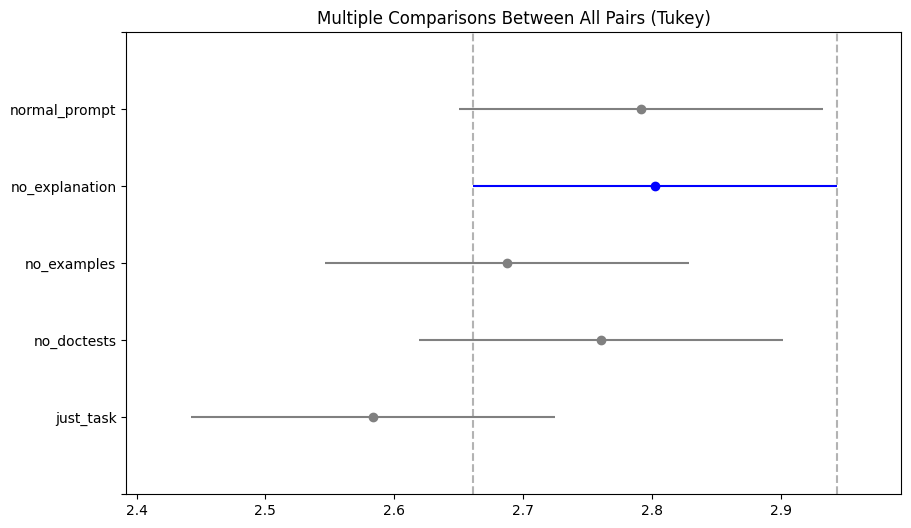

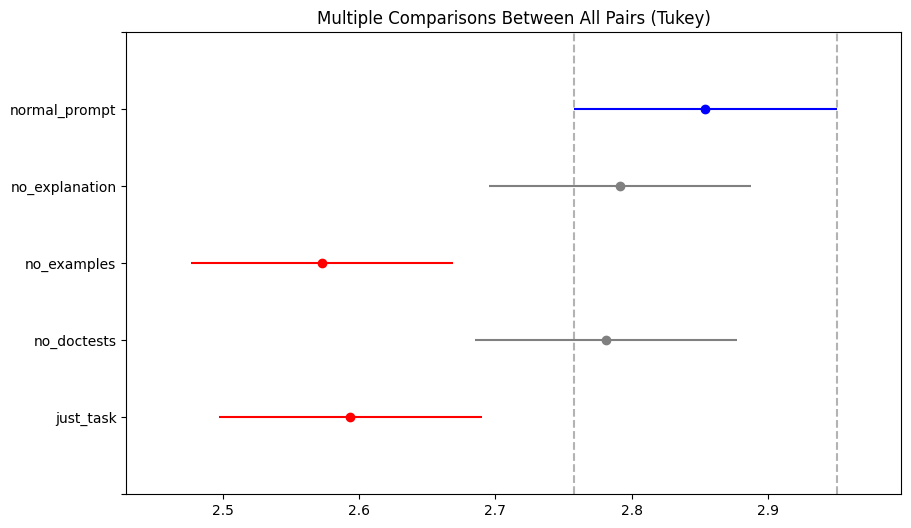

In [ ]:
# Statistical comparison (using statsmodels)
from statsmodels.stats.multicomp import pairwise_tukeyhsd
# import

results = {}
for dimension in ['Accuracy', 'Completeness', 'Relevance', 'Understandability']:
    print(f"\n===== {dimension} =====")
    tukey = pairwise_tukeyhsd(
        endog=df[dimension],
        groups=df['Prompt'],
        alpha=0.05
    )
    print(tukey.summary())
    results[dimension] = tukey
    top_prompt = (df.groupby('Prompt')[dimension].mean()
                .sort_values(ascending=False)
                .index[0])
    tukey.plot_simultaneous(
        comparison_name = top_prompt
    )

#results['Completeness'].plot_simultaneous()
print()


===== Accuracy =====
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower  upper  reject
--------------------------------------------------
 False   True   0.0211  0.65 -0.0703 0.1125  False
--------------------------------------------------

===== Completeness =====
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower  upper  reject
--------------------------------------------------
 False   True   0.2733 0.0003 0.1271 0.4196   True
--------------------------------------------------

===== Relevance =====
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower  upper  reject
--------------------------------------------------
 False   True   0.2356 0.0005 0.1044 0.3667   True
--------------------------------------------------

===== Understandability =====
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
--------------------------

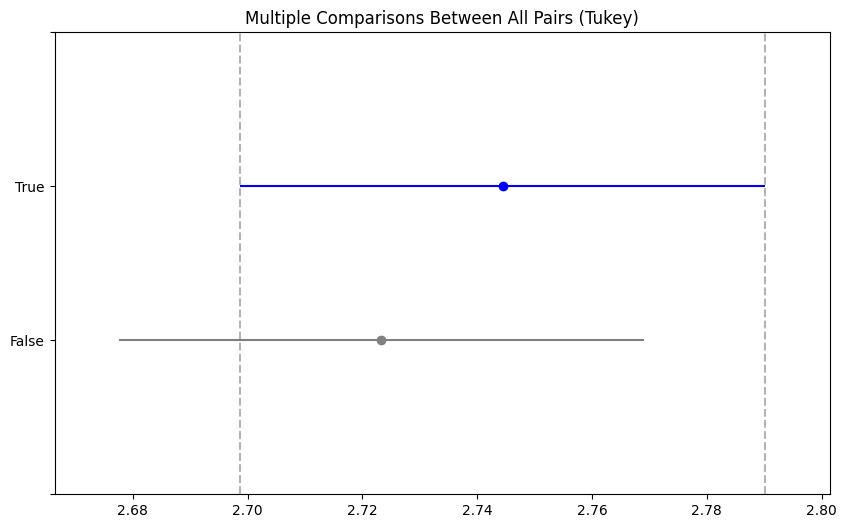

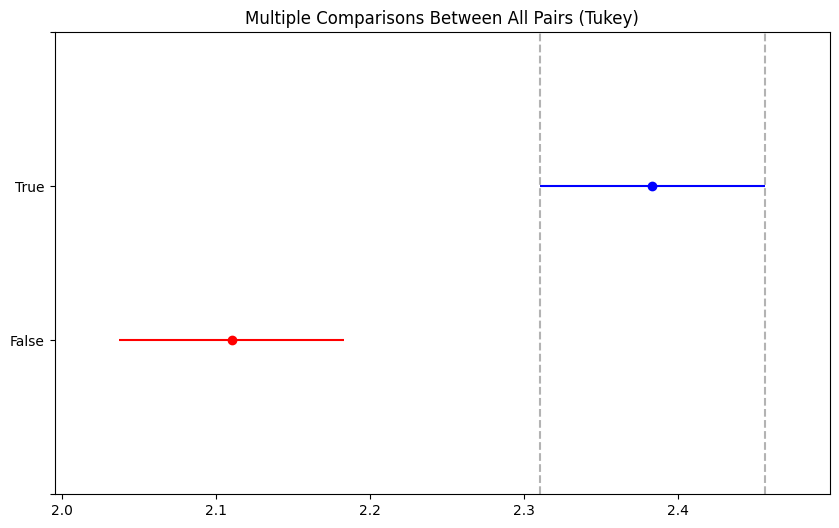

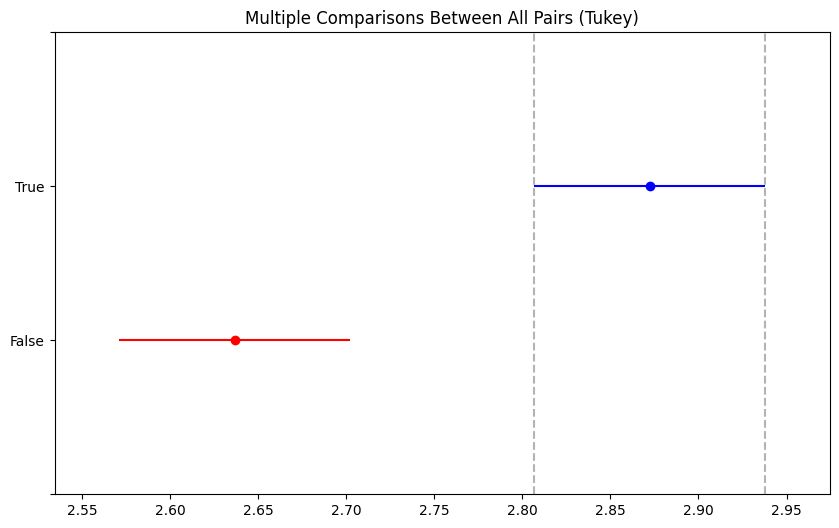

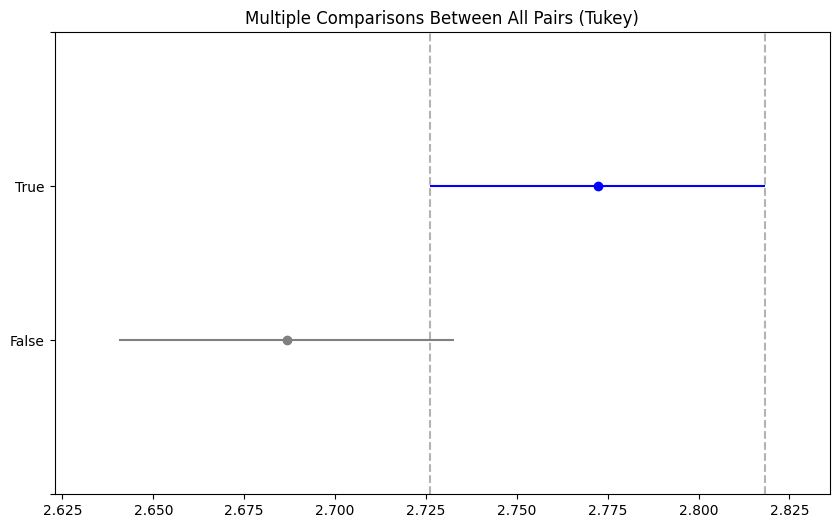

In [ ]:
# Statistical comparison (using statsmodels)
from statsmodels.stats.multicomp import pairwise_tukeyhsd
# import

results = {}
for dimension in ['Accuracy', 'Completeness', 'Relevance', 'Understandability']:
    print(f"\n===== {dimension} =====")
    tukey = pairwise_tukeyhsd(
        endog=df[dimension],
        groups=df['Is Reasoning Model'],
        alpha=0.05
    )
    print(tukey.summary())
    results[dimension] = tukey
    top_group = (df.groupby('Is Reasoning Model')[dimension].mean()
                .sort_values(ascending=False)
                .index[0])
    tukey.plot_simultaneous(
        comparison_name = top_group
    )

#results['Completeness'].plot_simultaneous()
print()

In [ ]:
# Compare Accuracy by LLMs

import altair as alt

# Create the bar chart
alt.Chart(df).mark_bar().encode(
    y='mean(Accuracy):Q',
    color='Model:N',
    column=alt.Column('Model:N', header=None)
).properties(width=25)


alt.Chart(...)

In [ ]:
# Compare Understandability by LLMs

import altair as alt

# Create the bar chart
alt.Chart(df).mark_bar().encode(
    y='mean(Understandability):Q',
    color='Model:N',
    column=alt.Column('Model:N', header=None)
).properties(width=25)


alt.Chart(...)

In [ ]:
# Compare Relevance by LLMs

import altair as alt

# Create the bar chart
alt.Chart(df).mark_bar().encode(
    y='mean(Relevance):Q',
    color='Model:N',
    column=alt.Column('Model:N', header=None)
).properties(width=25)


alt.Chart(...)

In [ ]:
# Compare Completeness by LLMs

import altair as alt

# Create the bar chart
alt.Chart(df).mark_bar().encode(
    y='mean(Completeness):Q',
    color='Model:N',
    column=alt.Column('Model:N', header=None)
).properties(width=25)


alt.Chart(...)

In [ ]:
# Calculate pearson correlation between usage of the reasoning technique and Output Quality. Also calculate statitstical significance

from scipy.stats import linregress

# Predefined set of models
reasoning_models = {'out_deepseek-deepseek-r1-or',
 'out_openai-o3-mini-or',
 'out_qwen-qwq-32b-or'}
df['Is Reasoning Model'] = df['Model'].isin(reasoning_models)

new = df[['Output Quality', 'Is Reasoning Model']].copy()
new["Is Reasoning Model"] = new["Is Reasoning Model"].astype(float)

linregress(x=new["Is Reasoning Model"], y=new["Output Quality"])


LinregressResult(slope=np.float64(0.2501217256821316), intercept=np.float64(-0.0937956471307995), rvalue=np.float64(0.17224645078624726), pvalue=np.float64(0.00014927539553538953), stderr=np.float64(0.06542551882233398), intercept_stderr=np.float64(0.040064784317893704))

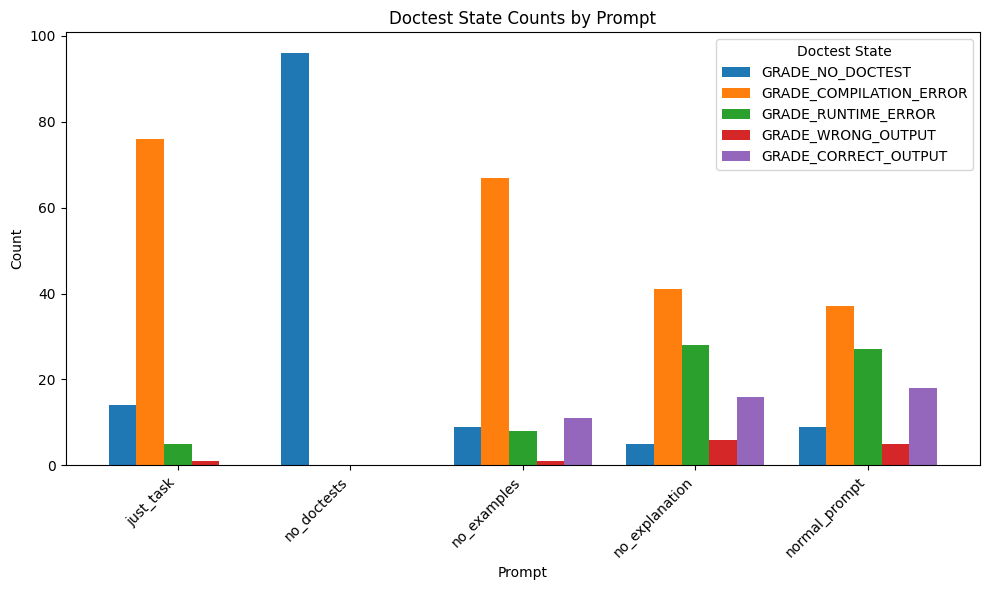

In [ ]:
# Plot Doctest state('Doctest') by Prompt
# Label mapping:
# ```
# GRADE_NO_DOCTEST = 0
# GRADE_COMPILATION_ERROR = 1
# GRADE_RUNTIME_ERROR = 2
# GRADE_WRONG_OUTPUT = 3
# GRADE_CORRECT_OUTPUT = 4
# ```

import matplotlib.pyplot as plt

# Count occurrences of each Doctest state for each LLM
doctest_counts = df.groupby(['Prompt', 'Doctest']).size().unstack(fill_value=0)

# Define the order of states and corresponding labels
state_order = [0, 1, 2, 3, 4]
state_labels = ['GRADE_NO_DOCTEST', 'GRADE_COMPILATION_ERROR', 'GRADE_RUNTIME_ERROR', 'GRADE_WRONG_OUTPUT', 'GRADE_CORRECT_OUTPUT']

# Create the bar plot
ax = doctest_counts.loc[:, state_order].plot(kind='bar', figsize=(10, 6), width=0.8)

# Customize the plot
plt.xlabel('Prompt')
plt.ylabel('Count')
plt.title('Doctest State Counts by Prompt')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.legend(title='Doctest State', labels=state_labels)


plt.tight_layout()  # Adjust layout to prevent labels from overlapping
plt.show()


In [ ]:
# Plot: ouput quality(y) by model (x) by prompt (multiple labeled neighboring vertical bars)

import altair as alt

# Create the bar chart
alt.Chart(df).mark_bar().encode(
    x='Model:N',  # Nominal encoding for the model (x-axis)
    y='mean(Output Quality):Q',  # Quantitative encoding for the output quality (y-axis)
    color='Prompt:N',  # Use the 'Prompt' column for color encoding
    column='Prompt:N'  # Use 'Prompt' column for creating columns of bar charts
).properties(width=200)


alt.Chart(...)

In [ ]:
# Create bar chart using Altair for output quality
alt.Chart(df).mark_bar().encode(
    x='Prompt:N',
    y='mean(Output Quality):Q',
    color='Model:N',
    column='Model:N'
).properties(width=200)


alt.Chart(...)

In [ ]:
# Create bar chart using Altair for accuracy
alt.Chart(df).mark_bar().encode(
    x='Prompt:N',
    y='mean(Accuracy):Q',
    color='Model:N',
    column='Model:N'
).properties(width=200)

alt.Chart(...)

In [ ]:
# Create bar chart using Altair for completeness
alt.Chart(df).mark_bar().encode(
    x='Prompt:N',
    y='mean(Completeness):Q',
    color='Model:N',
    column='Model:N'
).properties(width=200)

alt.Chart(...)

In [ ]:
# Create bar chart using Altair for relevance
alt.Chart(df).mark_bar().encode(
    x='Prompt:N',
    y='mean(Relevance):Q',
    color='Model:N',
    column='Model:N'
).properties(width=200)


alt.Chart(...)

In [ ]:
# Create bar chart using Altair for understandability
alt.Chart(df).mark_bar().encode(
    x='Prompt:N',
    y='mean(Understandability):Q',
    color='Model:N',
    column='Model:N'
).properties(width=200)

alt.Chart(...)

In [ ]:
# Visualize total inference costs of different models

import altair as alt
import pandas as pd
costs = {
  'name': [
	'anthropic/claude-3-7-sonnet',
	'openai/o3-mini',
	'deepseek/deepseek-r1',
	'qwen/qwq-32b',
	'google/gemini-2.0-flash-001',
	'openai/gpt-4o-mini',
	'google/gemini-2.0-flash-lite-001',
	'meta-llama/llama-3.3-70b-instruct'
  ],
  'cost (USD)' : [ \
	1.08,
	0.958,
	0.433,
	0.0588,
	0.0334,
	0.0298,
	0.0212,
	0.021
  ]
}


# Create the bar chart
alt.Chart(pd.DataFrame.from_dict(costs)).mark_bar().encode(
    y='sum(cost (USD)):Q',
    color='name:N',
).properties(width=100)


alt.Chart(...)